In [1]:
import numpy as np
import time
import cv2
import os
from os import listdir
from os.path import isfile, join
from matplotlib import pyplot as plt 

# Define our imshow function 
def imshow(title = "Image", image = None, size = 10):
    w, h = image.shape[0], image.shape[1]
    aspect_ratio = w/h
    plt.figure(figsize=(size * aspect_ratio,size))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title(title)
    plt.show()

1. Using Model: candy


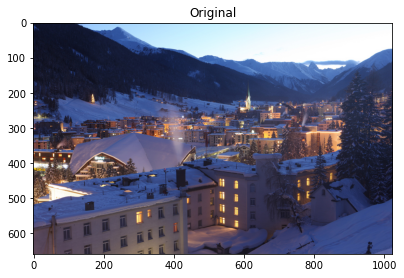

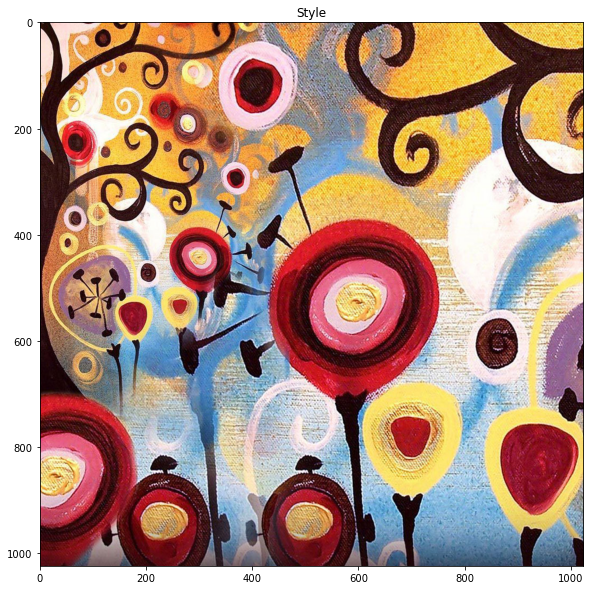

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


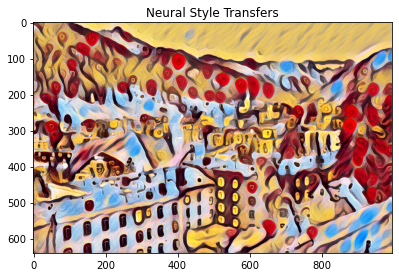

2. Using Model: composition_vii


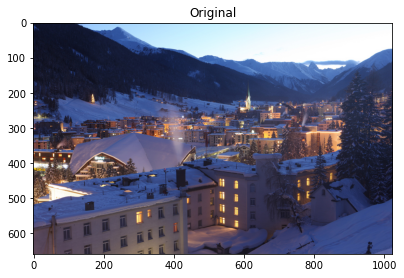

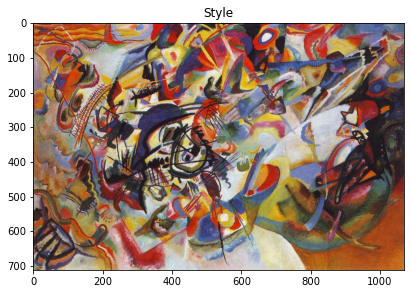

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


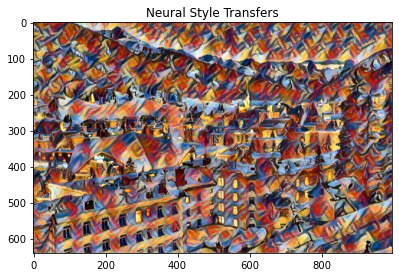

3. Using Model: feathers


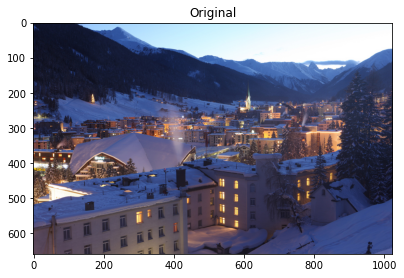

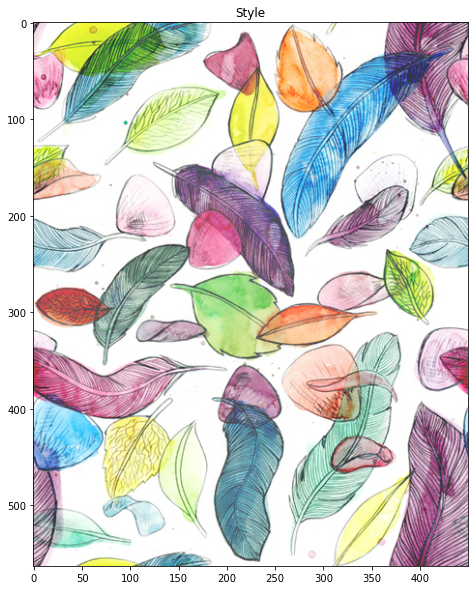

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


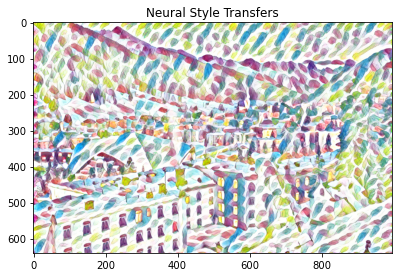

4. Using Model: la_muse


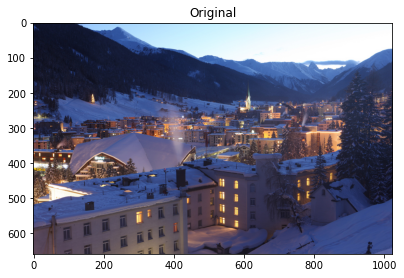

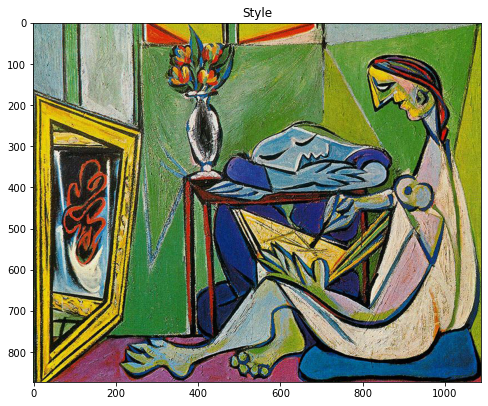

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


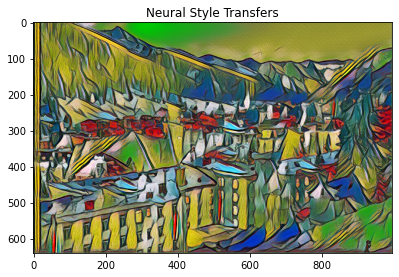

5. Using Model: mosaic


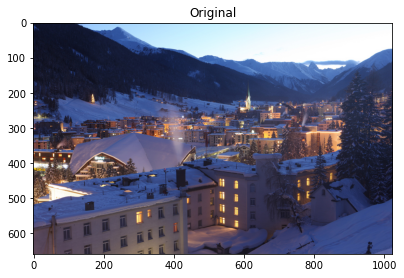

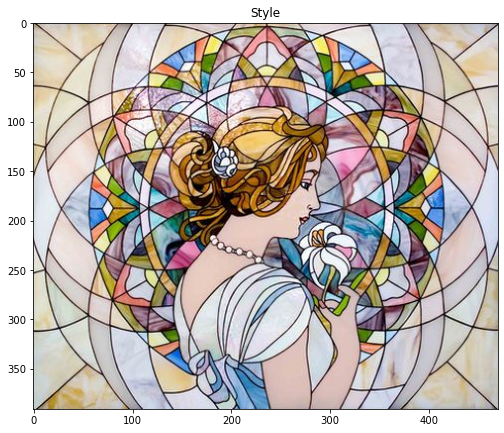

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


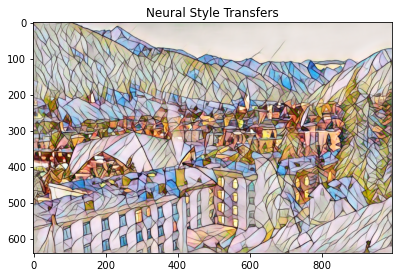

6. Using Model: starry_night


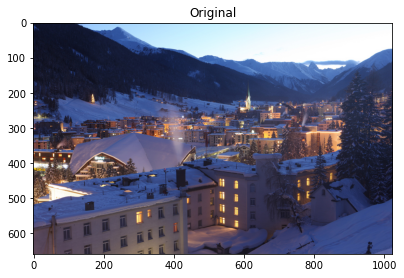

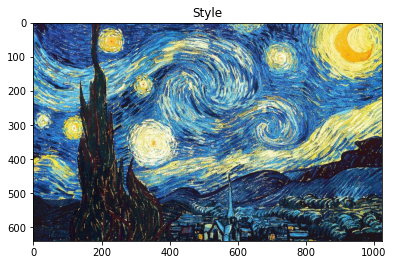

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


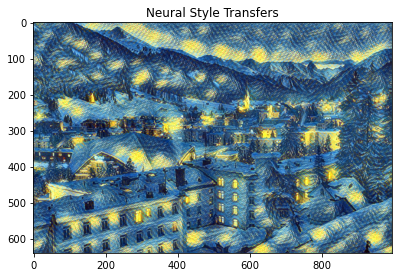

7. Using Model: the_scream


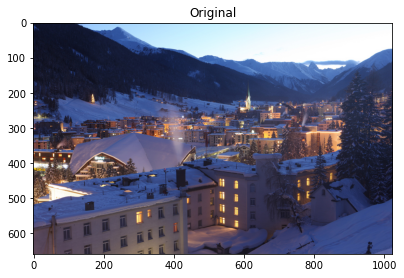

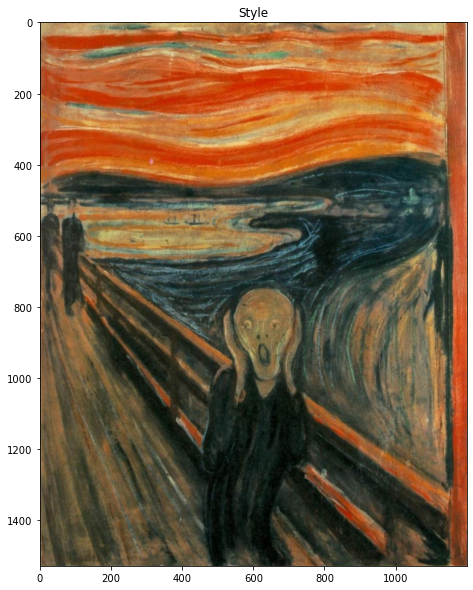

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


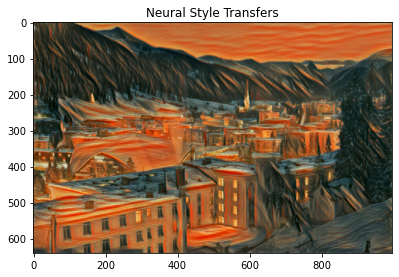

8. Using Model: the_wave


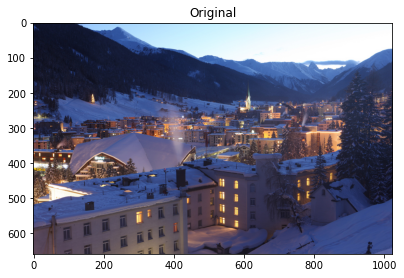

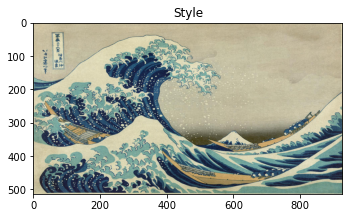

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


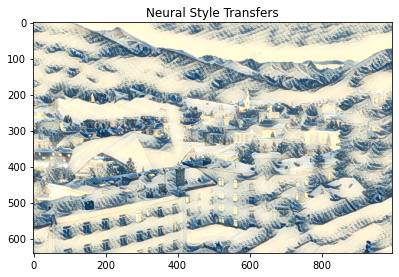

9. Using Model: udnie


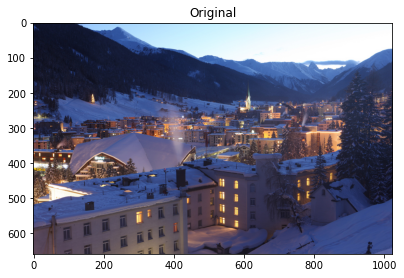

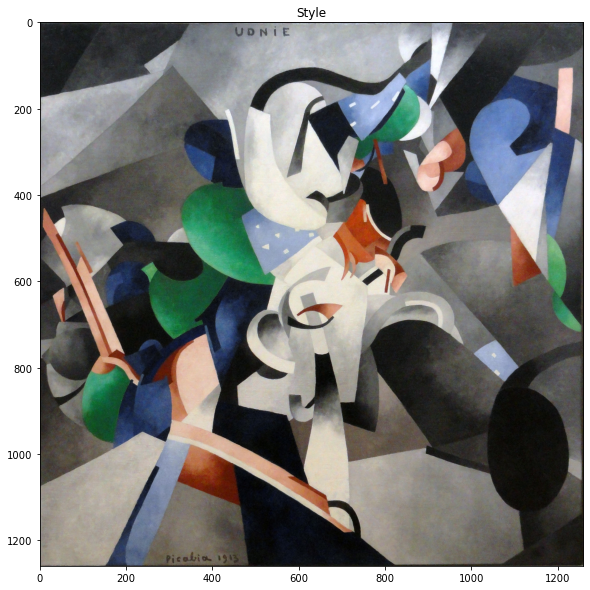

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


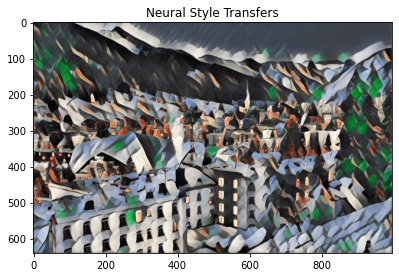

In [4]:
model_file_path = "../NeuralStyleTransfer/NeuralStyleTransfer/models/"
model_file_paths = [f for f in listdir(model_file_path) if isfile(join(model_file_path, f))]

# Load our test image
img = cv2.imread("../images/images_tilt/images/original/city.jpg")

# Loop through and applying each model style our input image
for (i,model) in enumerate(model_file_paths):
    # print the model being used
    print(str(i+1) + ". Using Model: " + str(model)[:-3])    
    style = cv2.imread("../NeuralStyleTransfer/NeuralStyleTransfer/art/"+str(model)[:-3]+".jpg")
    # loading our neural style transfer model 
    neuralStyleModel = cv2.dnn.readNetFromTorch(model_file_path+ model)

    # Let's resize to a fixed height of 640 (feel free to change)
    height, width = int(img.shape[0]), int(img.shape[1])
    newWidth = int((640 / height) * width)
    resizedImg = cv2.resize(img, (newWidth, 640), interpolation = cv2.INTER_AREA)

    # Create our blob from the image and then perform a forward pass run of the network
    inpBlob = cv2.dnn.blobFromImage(resizedImg, 1.0, (newWidth, 640), (103.939, 116.779, 123.68), swapRB=False, crop=False)

    neuralStyleModel.setInput(inpBlob)
    output = neuralStyleModel.forward()

    # Reshaping the output tensor, adding back  the mean subtraction and re-ordering the channels 
    output = output.reshape(3, output.shape[2], output.shape[3])
    output[0] += 103.939
    output[1] += 116.779
    output[2] += 123.68
    output /= 255
    output = output.transpose(1, 2, 0)
    
    #Display our original image, the style being applied and the final Neural Style Transfer
    imshow("Original", img)
    imshow("Style", style)
    imshow("Neural Style Transfers", output)

In [2]:
model_file_path = "../NeuralStyleTransfer/NeuralStyleTransfer/models/"
model_file_paths = [f for f in listdir(model_file_path) if isfile(join(model_file_path, f))]
model_file_paths

['candy.t7',
 'composition_vii.t7',
 'feathers.t7',
 'la_muse.t7',
 'mosaic.t7',
 'starry_night.t7',
 'the_scream.t7',
 'the_wave.t7',
 'udnie.t7']

1. Using Model: composition_vii


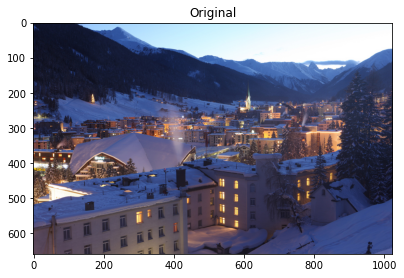

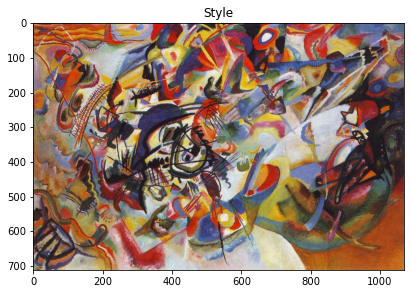

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


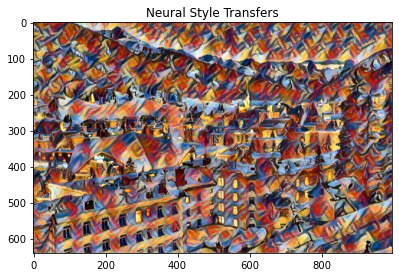

2. Using Model: la_muse


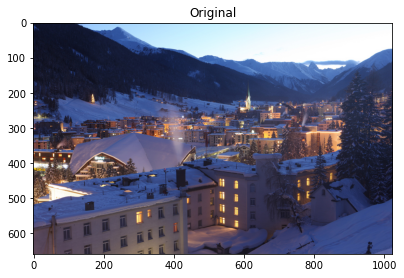

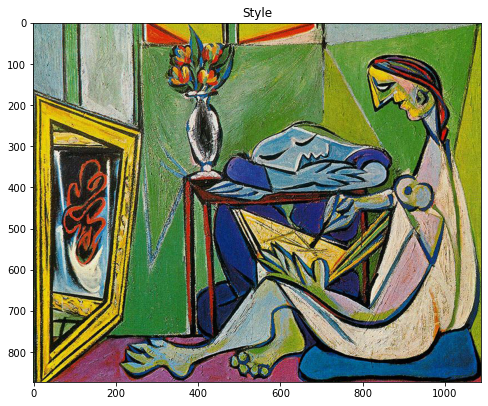

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


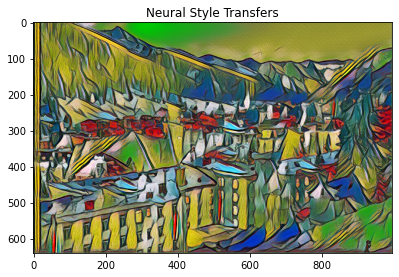

3. Using Model: starry_night


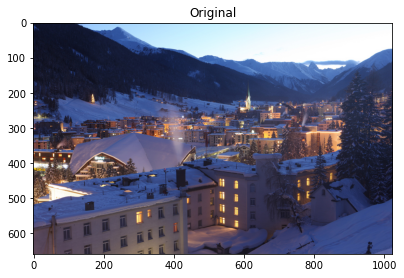

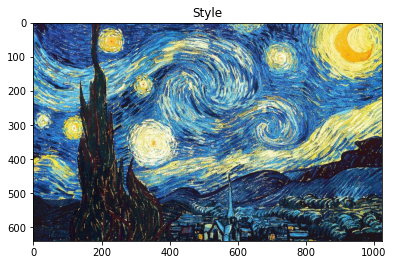

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


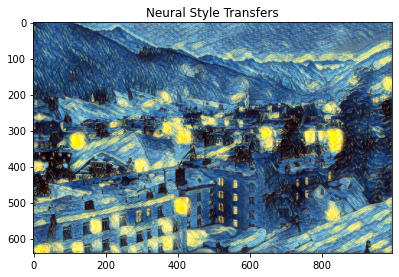

4. Using Model: the_wave


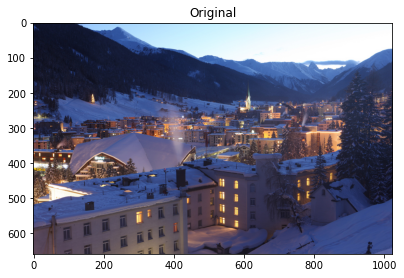

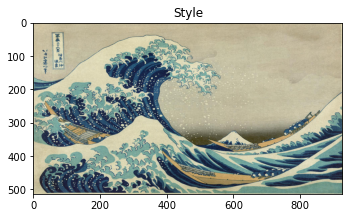

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


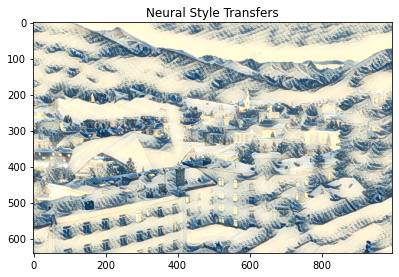

In [5]:
model_file_path = "../NeuralStyleTransfer/NeuralStyleTransfer/models/ECCV16/"
model_file_paths = [f for f in listdir(model_file_path) if isfile(join(model_file_path, f))]

# Load our test image
img = cv2.imread("../images/images_tilt/images/original/city.jpg")

# Loop through and applying each model style our input image
for (i,model) in enumerate(model_file_paths):
    # print the model being used
    print(str(i+1) + ". Using Model: " + str(model)[:-3])    
    style = cv2.imread("../NeuralStyleTransfer/NeuralStyleTransfer/art/"+str(model)[:-3]+".jpg")
    # loading our neural style transfer model 
    neuralStyleModel = cv2.dnn.readNetFromTorch(model_file_path+ model)

    # Let's resize to a fixed height of 640 (feel free to change)
    height, width = int(img.shape[0]), int(img.shape[1])
    newWidth = int((640 / height) * width)
    resizedImg = cv2.resize(img, (newWidth, 640), interpolation = cv2.INTER_AREA)

    # Create our blob from the image and then perform a forward pass run of the network
    inpBlob = cv2.dnn.blobFromImage(resizedImg, 1.0, (newWidth, 640), (103.939, 116.779, 123.68), swapRB=False, crop=False)

    neuralStyleModel.setInput(inpBlob)
    output = neuralStyleModel.forward()

    # Reshaping the output tensor, adding back  the mean subtraction and re-ordering the channels 
    output = output.reshape(3, output.shape[2], output.shape[3])
    output[0] += 103.939
    output[1] += 116.779
    output[2] += 123.68
    output /= 255
    output = output.transpose(1, 2, 0)
    
    #Display our original image, the style being applied and the final Neural Style Transfer
    imshow("Original", img)
    imshow("Style", style)
    imshow("Neural Style Transfers", output)